In [1]:
import pandas as pd
df = pd.read_csv('rhinohorn_filtered_tweets.csv')

In [2]:
df.head()

,Unnamed: 0.1,Unnamed: 0,tweet_link,username,tweet_content,classification
0,33,33,/randdrop/status/1640970252107542528#m,Random Drops,Characters: Goblin Trading Cabal.,0.988573
1,41,41,/randdrop/status/1640245504155037696#m,Random Drops,Plot: A Elvish Trading Envoy is ambushed by D...,0.984224
2,48,48,/randdrop/status/1639611382806233088#m,Random Drops,Item: Azj Trewnop's Tome of Salvaged Halos.,0.975173
3,55,55,/randdrop/status/1638977144620732418#m,Random Drops,Plot: The Crystal Tent was hidden from us in t...,0.934166
4,60,60,/randdrop/status/1638524155372134400#m,Random Drops,Plot: The Gem Flask was last seen in the Ambiv...,0.911442


In [6]:
# Initialize the new list of dictionaries
import ast
new_list = []



# Iterate through each row in the DataFrame
for index, row in df.iterrows():
    username = row['username']
    #join_date = row['join_date']
    tweets = ast.literal_eval(row['tweets'])  # Convert string representation of list to an actual list
    replies = ast.literal_eval(row['replies'])
    for tweet in tweets:
        tweet_link = tweet['tweet_link']
        tweet_content = tweet['tweet_content']
        new_list.append({
            'tweet_link': tweet_link,
            'username': username,
            'tweet_content': tweet_content
        })

    for tweet in replies:
        tweet_link = tweet['tweet_link']
        tweet_content = tweet['tweet_content']
        new_list.append({
            'tweet_link': tweet_link,
            'username': username,
            'tweet_content': tweet_content
        })


# Now, new_list contains the transformed data
#print(new_list)

# If you want to save this list to a new CSV file:
new_df = pd.DataFrame(new_list)
new_df = new_df.dropna(axis = 0)
new_df.to_csv('pangolin_filtered_tweets.csv', index = True)

KeyError: 'tweets'

In [3]:
import pandas as pd
new_df = pd.read_csv('rhinohorn_filtered_tweets.csv')

In [4]:
import os 
import pandas as pd
!pip install sentence-transformers
from sentence_transformers import SentenceTransformer
embedder=SentenceTransformer('paraphrase-MiniLM-L12-v2') 


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


/workspace/B220032CS_Jaefar/ocw_summer_2024/venv/lib/python3.10/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.73k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

/workspace/B220032CS_Jaefar/ocw_summer_2024/venv/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [5]:
!pip install tweet-preprocessor
!pip install scikit-learn
import re
import preprocessor as p

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [6]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [7]:
def clean_tweets(df):
    REPLACE_NO_SPACE = re.compile(r"(\.)|(\;)|(\:)|(\!)|(\')|(\?)|(\,)|(\")|(\|)|(\()|(\))|(\[)|(\])|(\%)|(\$)|(\>)|(\<)|(\{)|(\})")
    REPLACE_WITH_SPACE = re.compile(r"(<br\s/><br\s/?)|(-)|(/)|(:).")
    tempArr = []
    for line in df:
        # Check if the value is a string or NaN
        if isinstance(line, str):
            # Send to tweet_processor
            tmpL = p.clean(line)
            # Remove punctuation
            tmpL = REPLACE_NO_SPACE.sub("", tmpL.lower())  # Convert all tweets to lower cases
            tmpL = REPLACE_WITH_SPACE.sub(" ", tmpL)
            tempArr.append(tmpL)
        else:
            # Handle NaN values or non-string types
            tempArr.append("")  # You can choose to skip these entries or replace them with a placeholder
    return tempArr

In [8]:
df = pd.read_csv('rhinohorn_filtered_tweets.csv')

In [9]:
tweets=df['tweet_content']
tweets=clean_tweets(tweets)

In [10]:
temp=list(tweets)

In [11]:
embeddings=embedder.encode(temp)

In [12]:
num_clusters = 40
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(embeddings)
cluster_assignment = clustering_model.labels_

In [13]:
cluster_assignment

array([38, 34, 34, ..., 29,  1, 37], dtype=int32)

In [14]:
cluster_df = pd.DataFrame(temp, columns = ['temp'])
cluster_df['cluster'] = cluster_assignment


In [15]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(temp[sentence_id])

filename="cluster_"+str(num_clusters)+"_pangolin.txt"
with open(filename,"w",encoding='utf-8') as f1:
    for i,cluster in enumerate(clustered_sentences):
        f1.write("Cluster "+str(i)+'\n')
        for line in cluster:
            f1.write(line+'\n')
        f1.write('\n')

In [16]:
def word_cloud(pred_df,label):
    wc = ' '.join([text for text in pred_df['temp'][pred_df['cluster'] == label]])
    wordcloud = WordCloud(width=800, height=500,random_state=21, max_font_size=110).generate(wc)
    fig7 = plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.show()
    print(label)

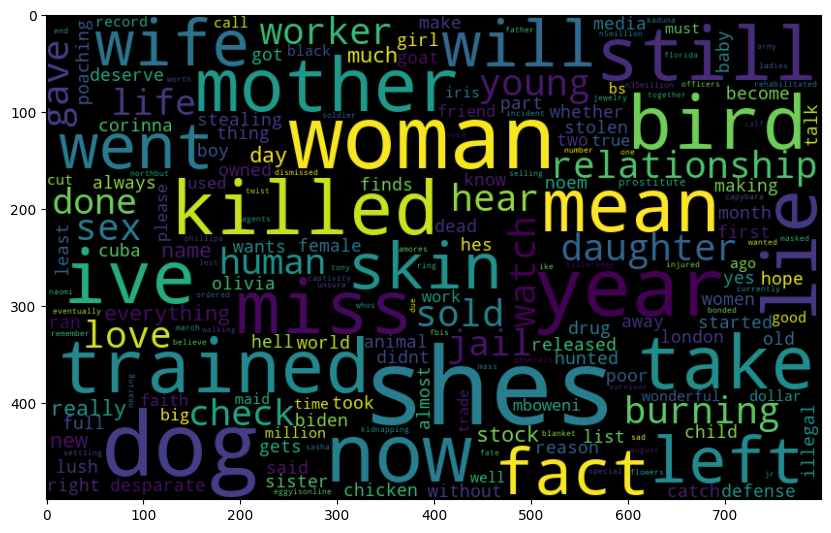

0


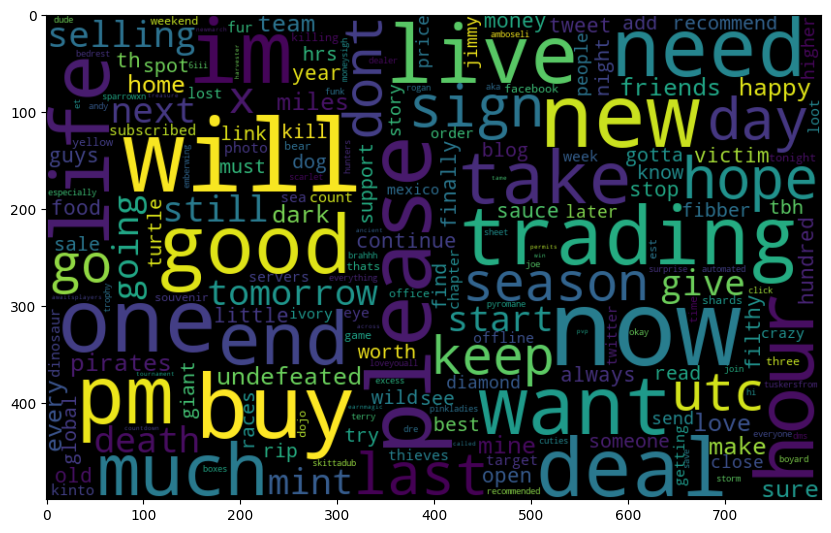

1


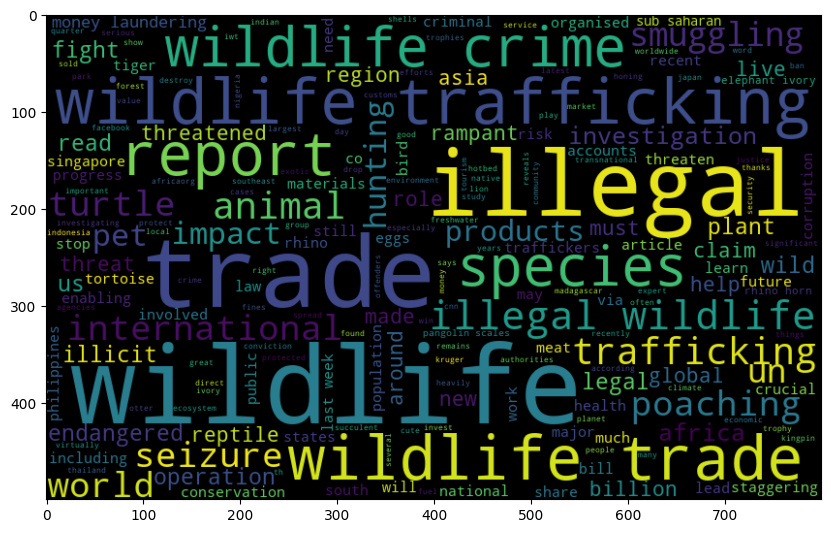

2


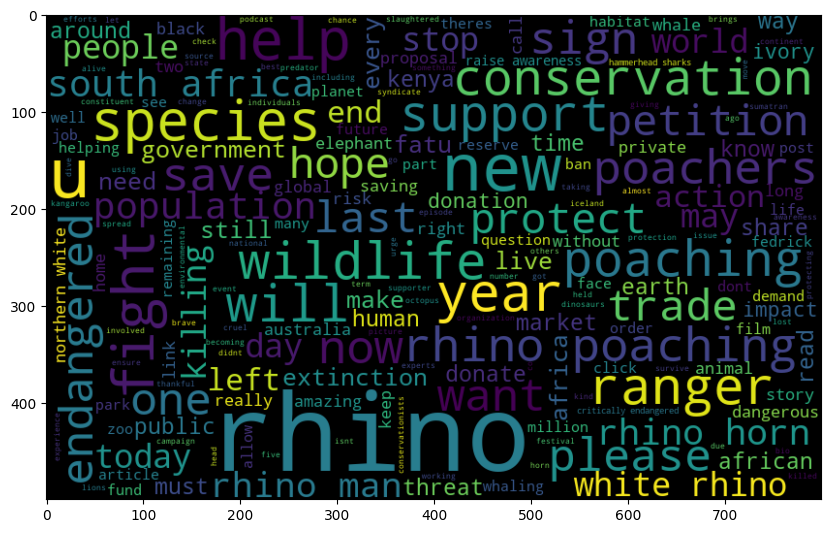

3


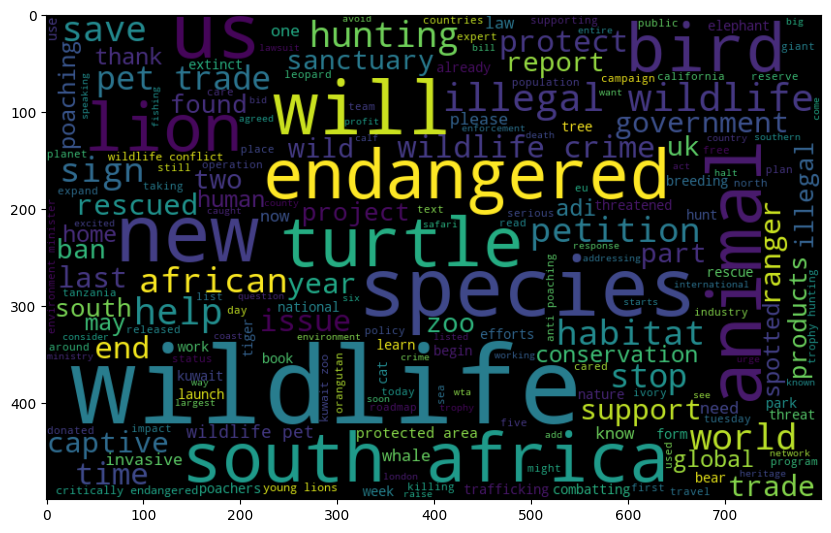

4
5


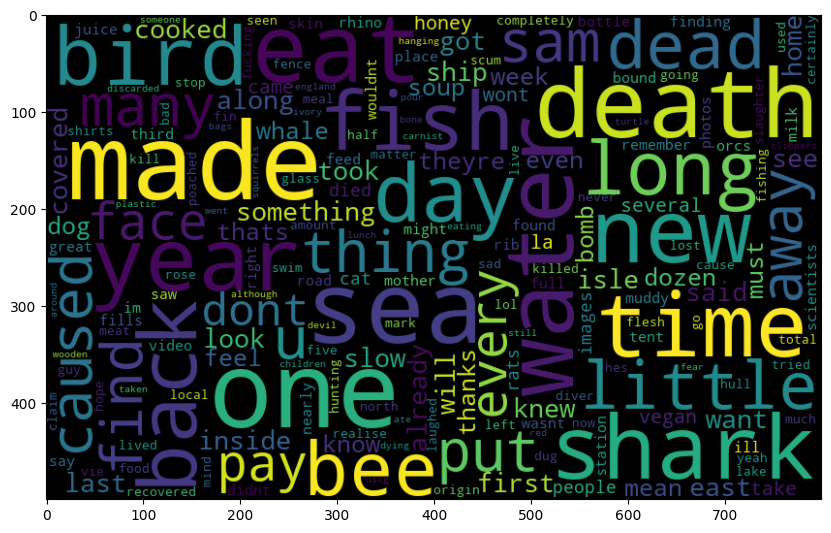

6


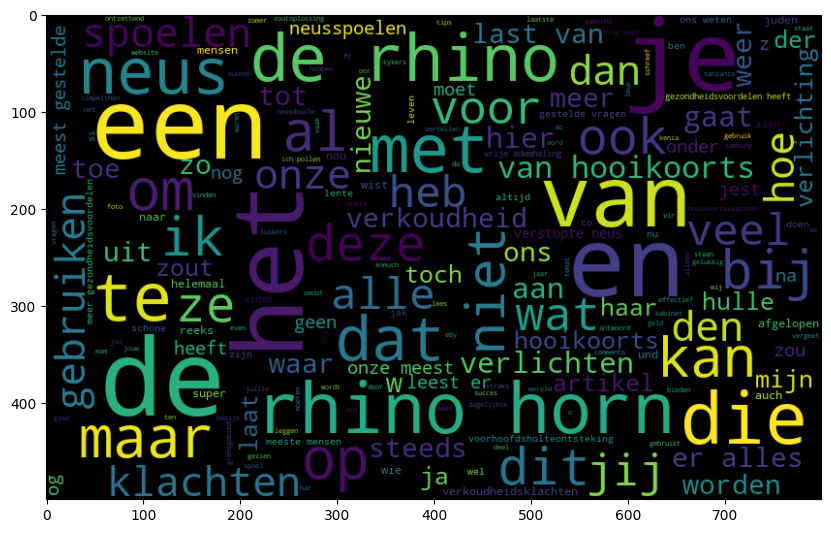

7


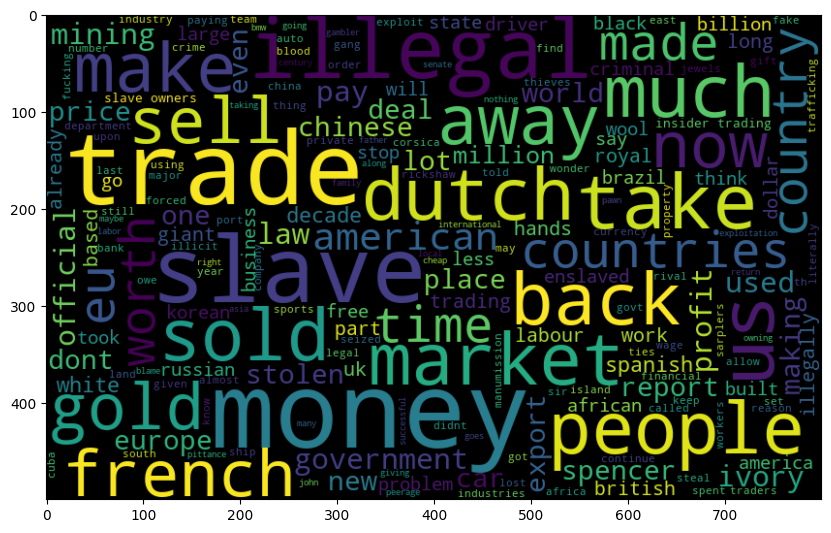

8


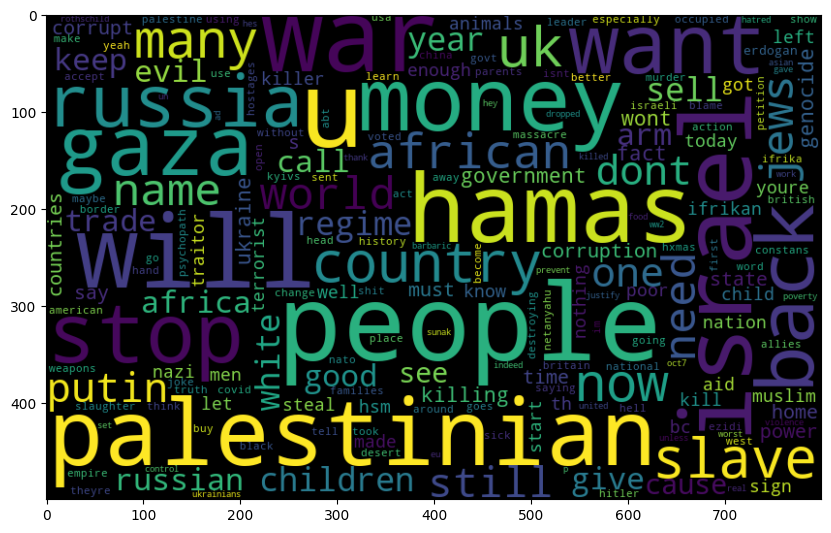

9


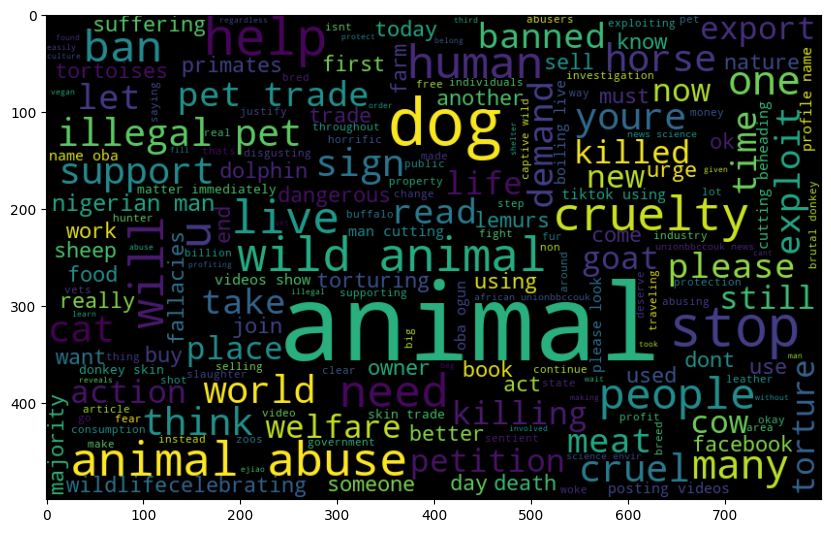

10


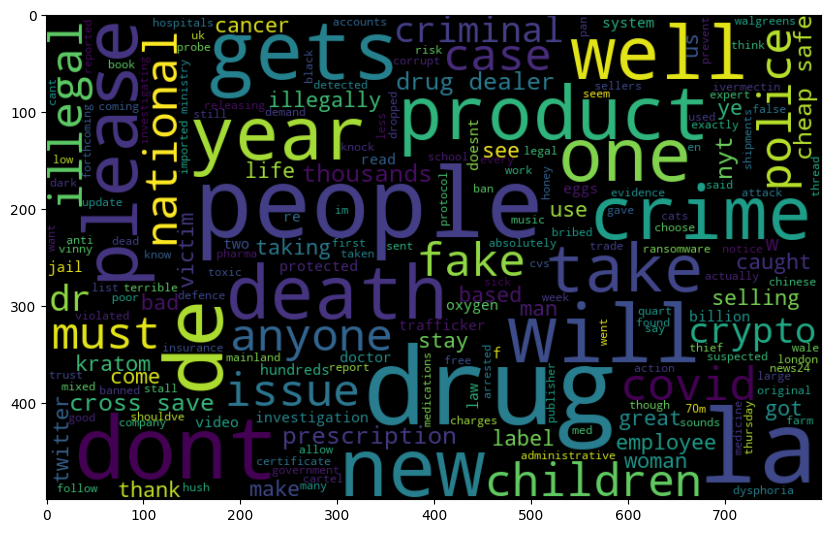

11


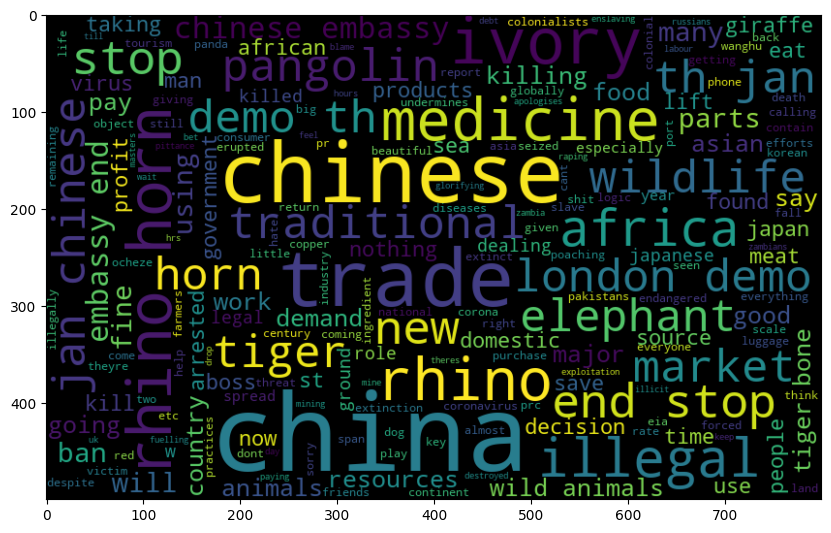

12


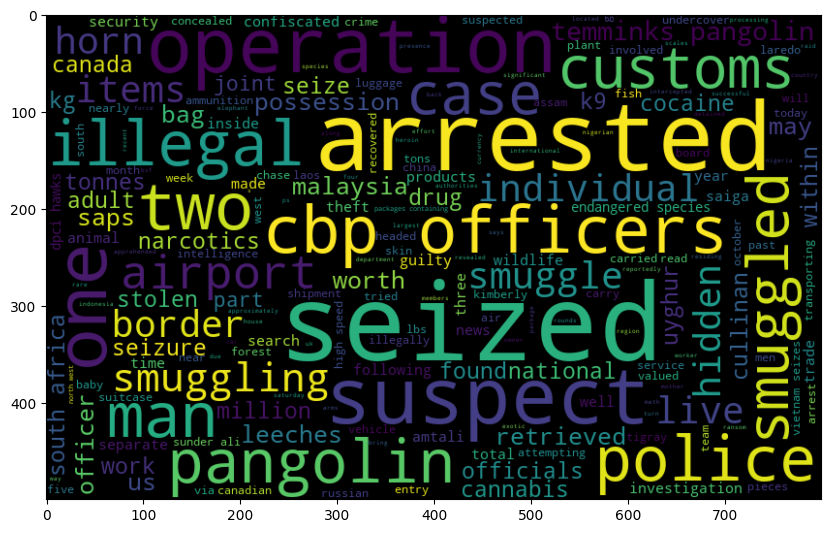

13


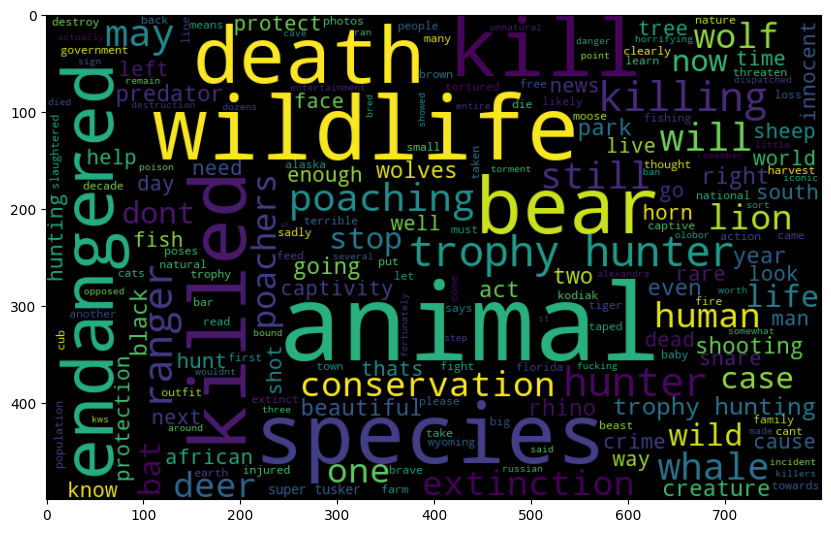

14


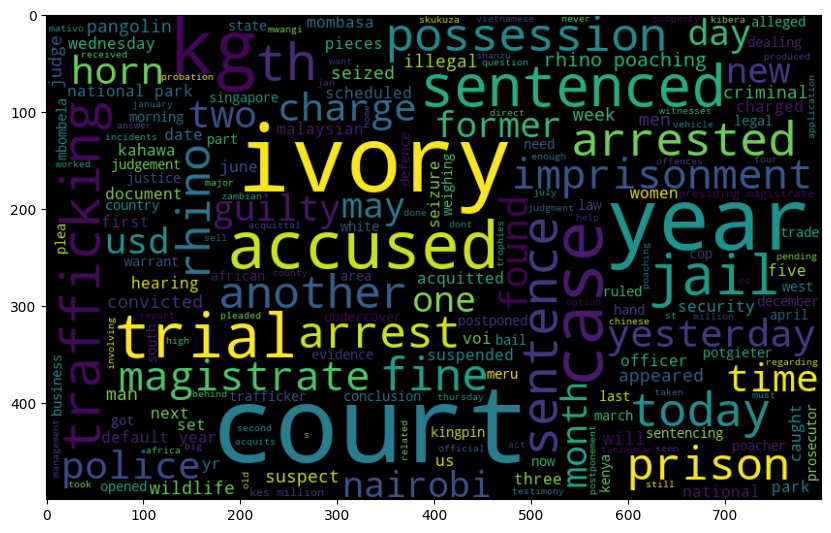

15


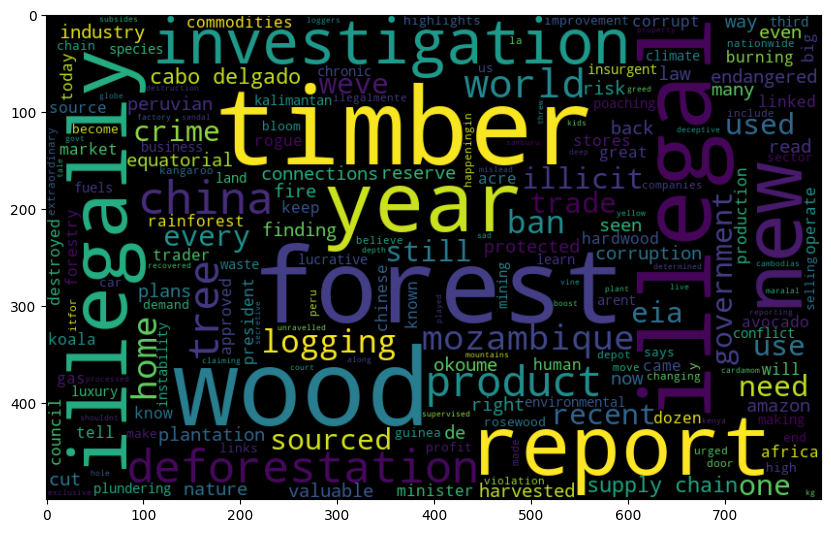

16


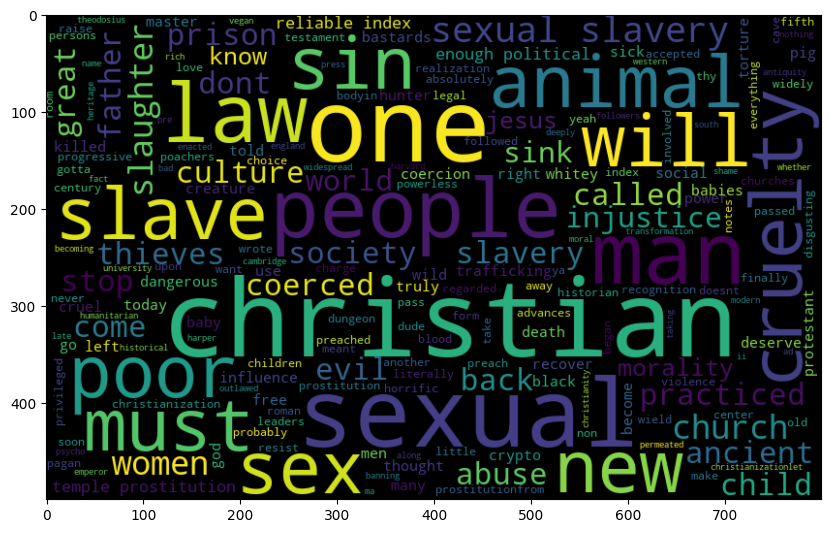

17


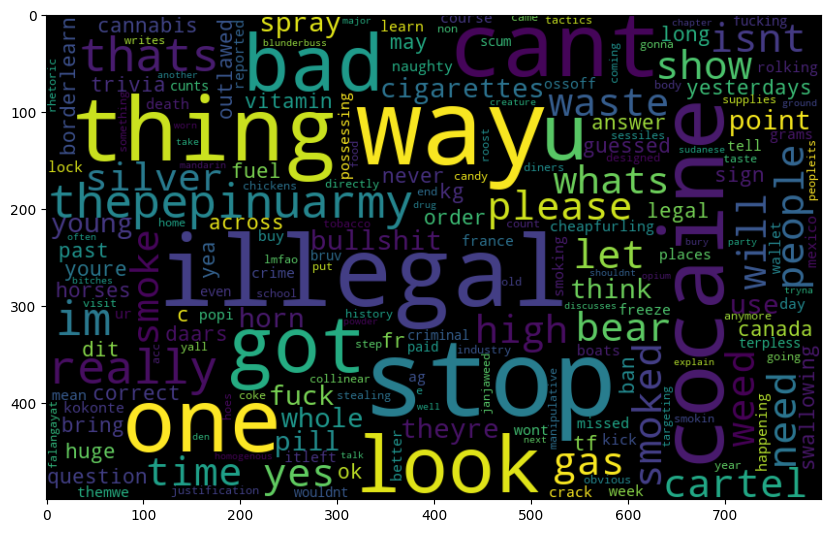

18


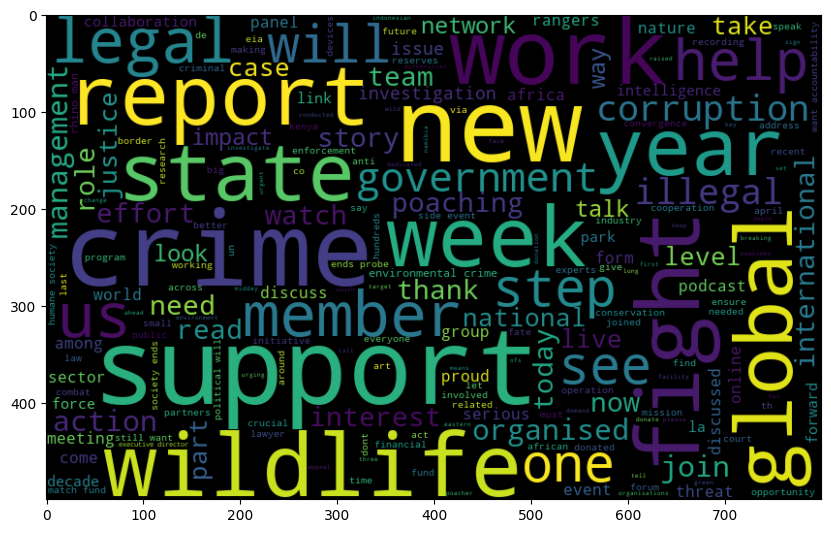

19


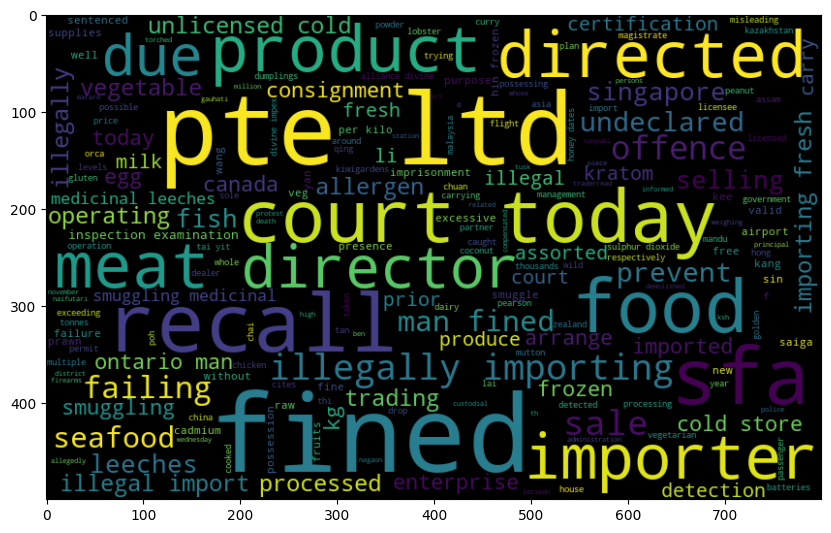

20


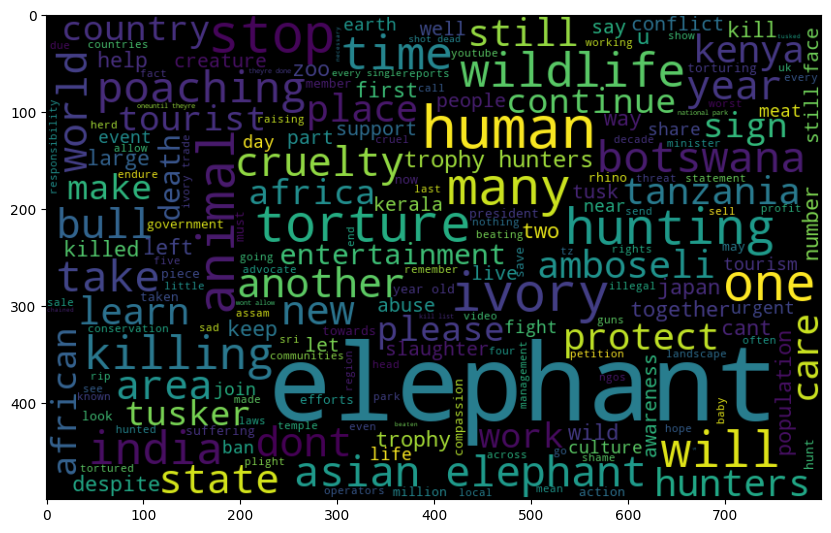

21


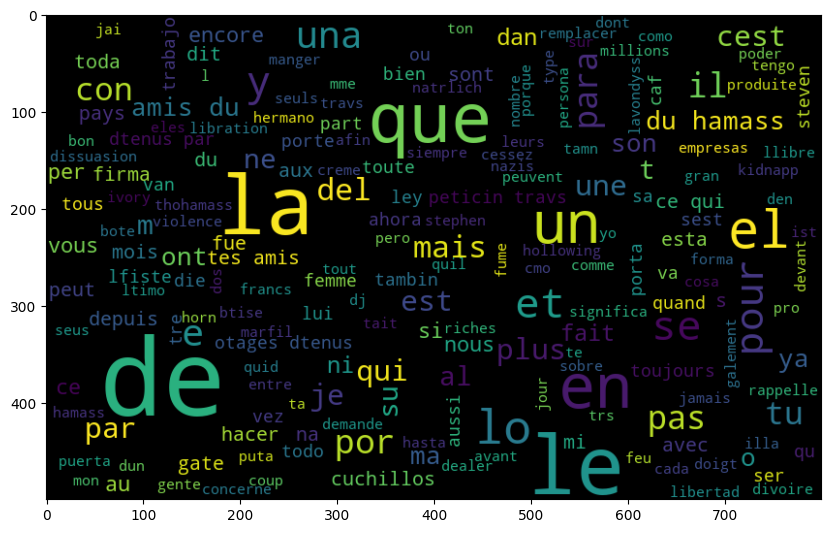

22


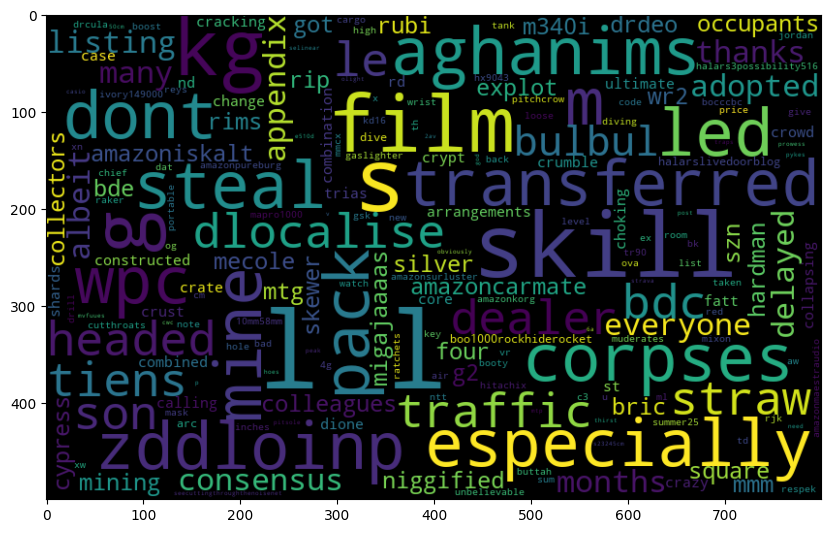

23


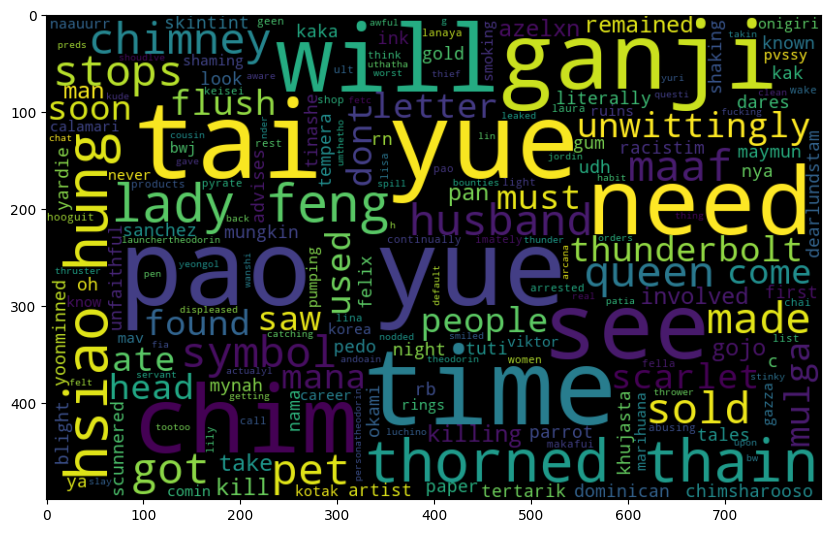

24


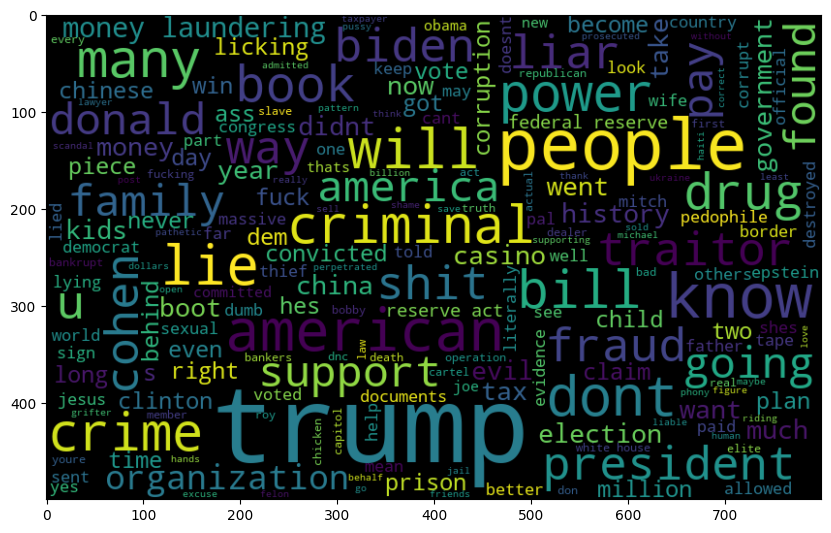

25


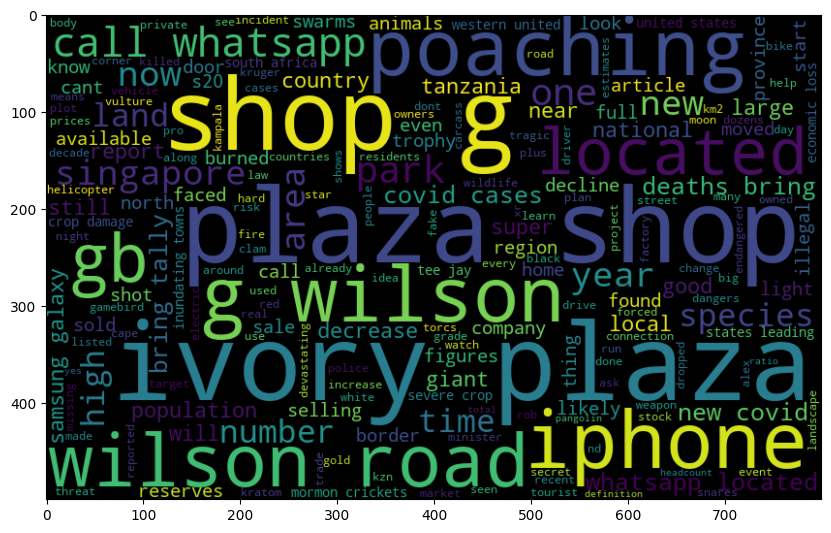

26


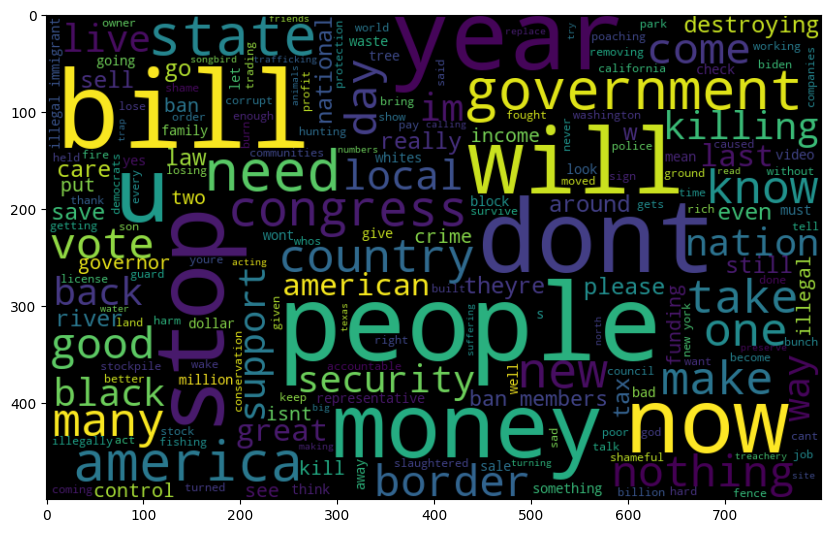

27


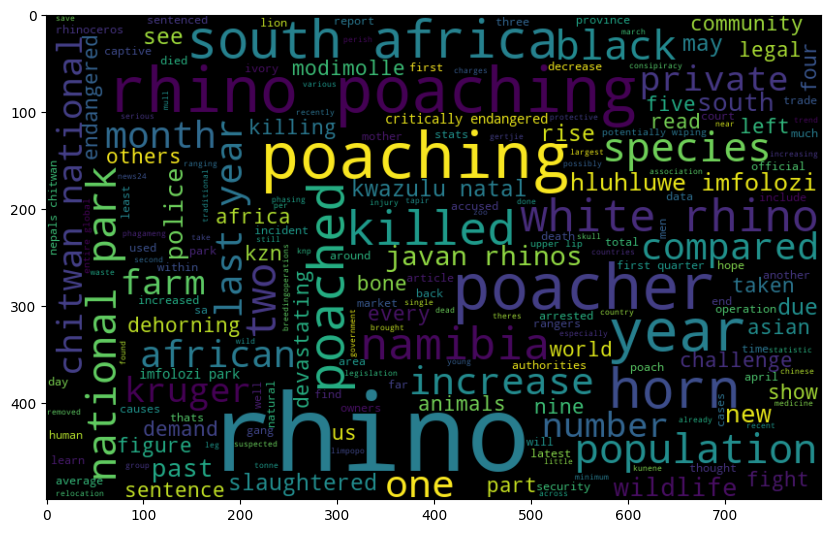

28


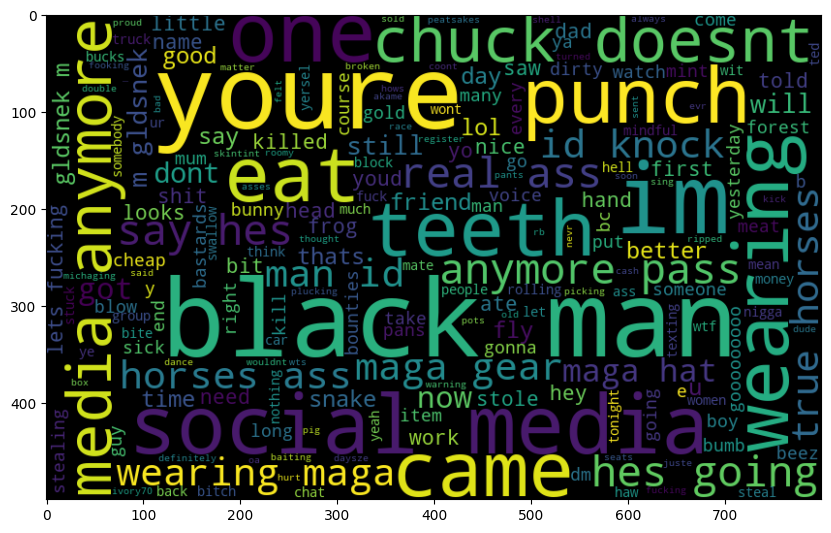

29


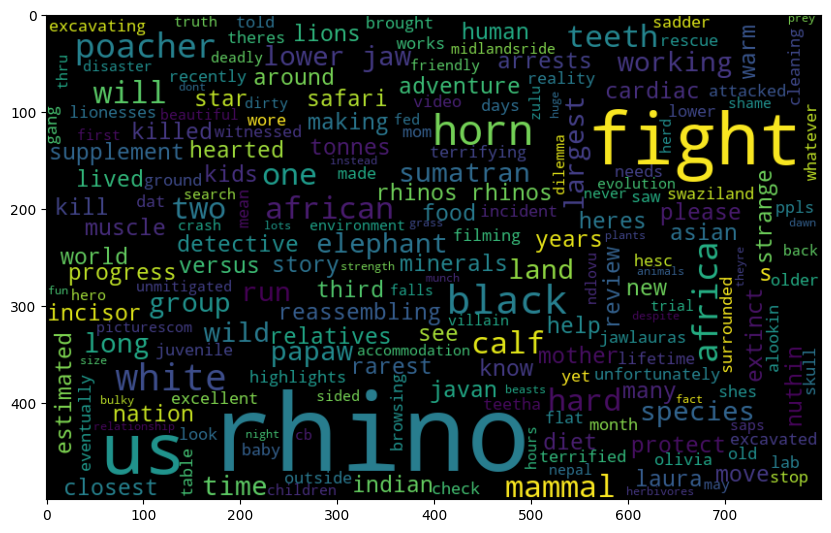

30


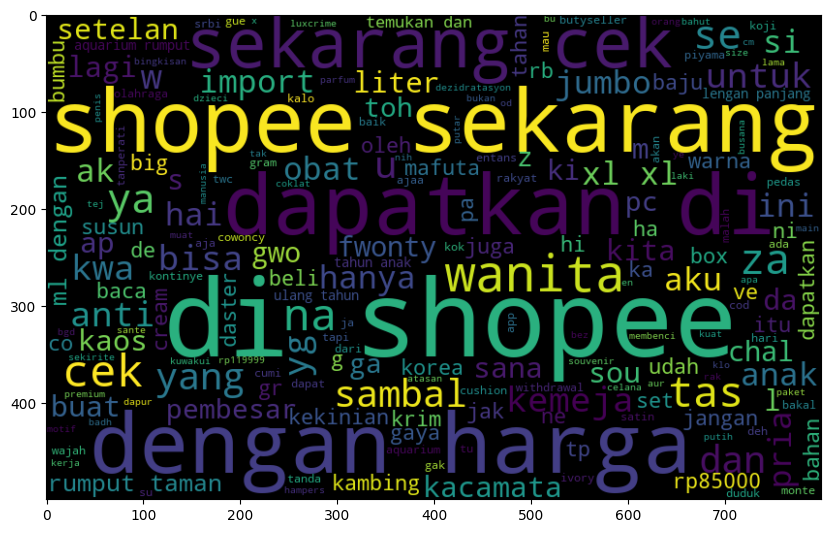

31


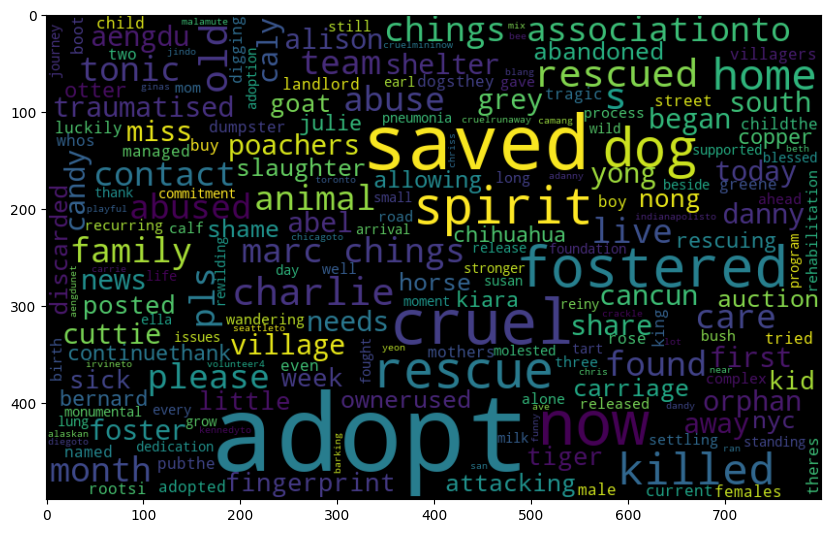

32


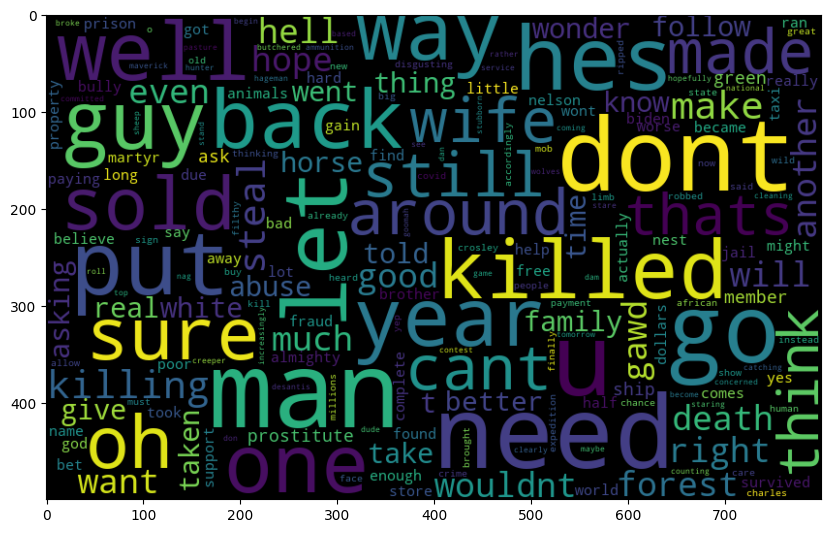

33


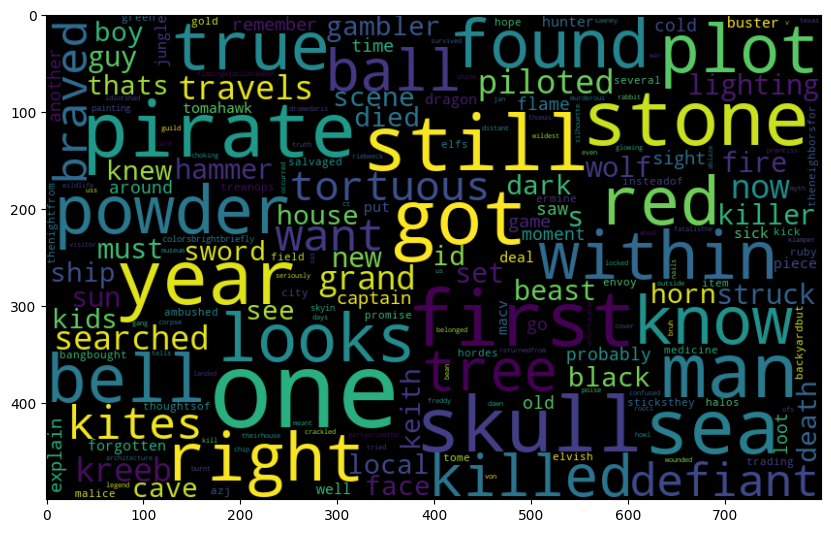

34


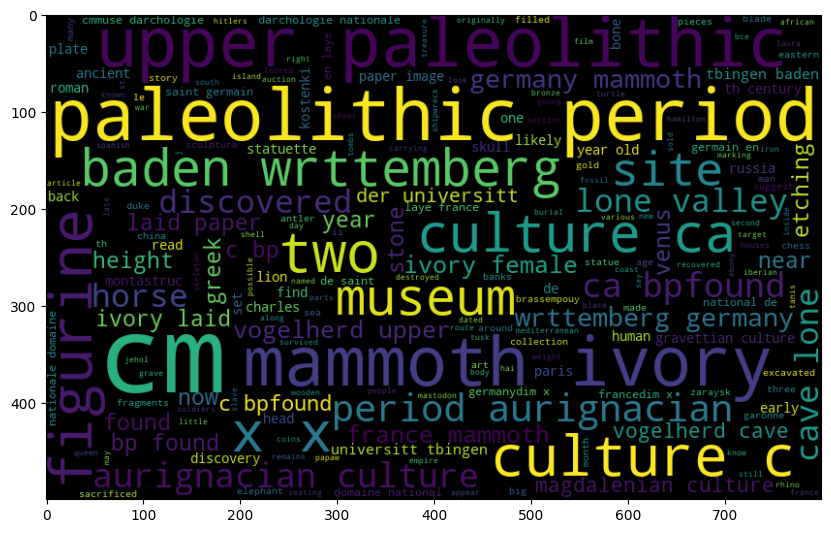

35


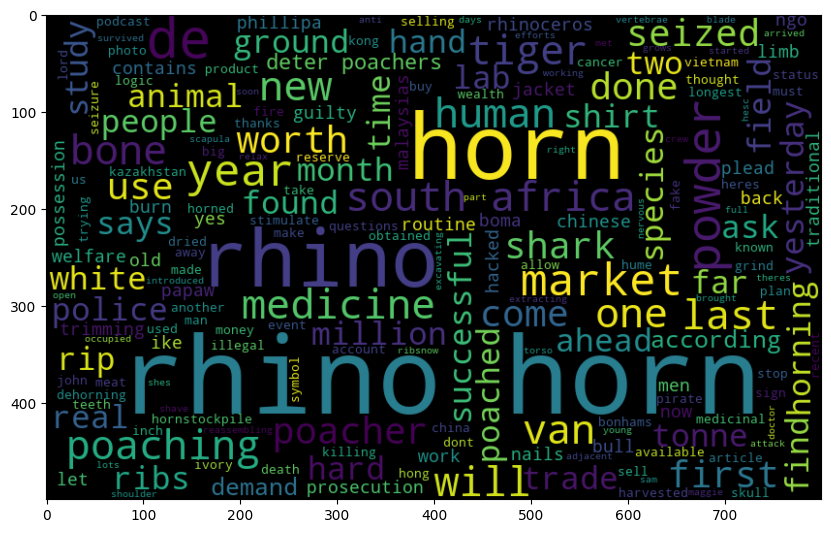

36


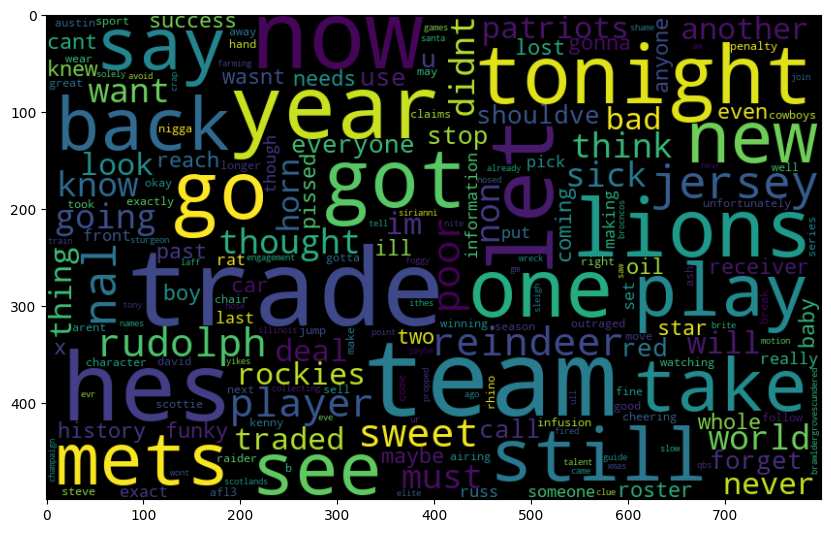

37


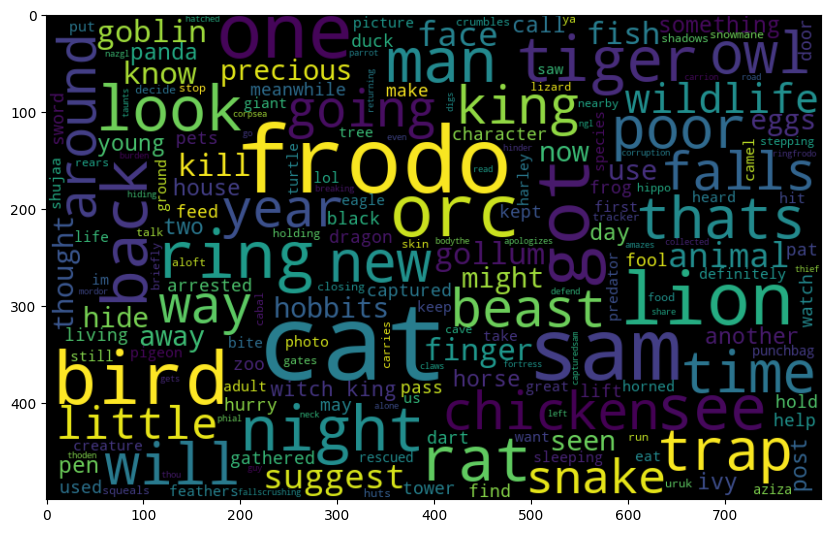

38


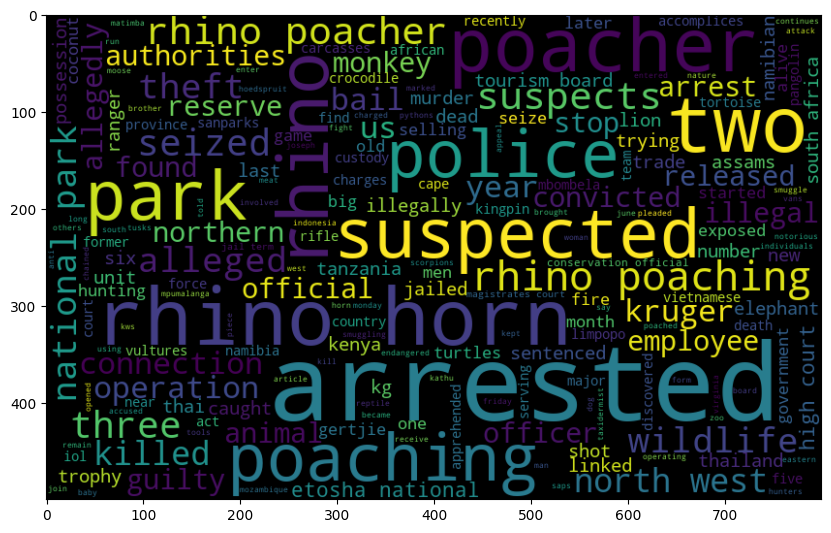

39


In [18]:
for i in range(0,40):
    try:
        word_cloud(cluster_df,i)
    except:
        print(i)